# Import Thư viện📚

In [ ]:
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from matplotlib.pyplot import *
import community.community_louvain as community_louvain
from networkx.algorithms.community.centrality import girvan_newman
from networkx.algorithms import bipartite
import matplotlib.cm as cm
from matplotlib.pyplot import figure
import seaborn as sns
import operator
import itertools
from sklearn import cluster
sns.set_style('whitegrid')

# Đọc dữ liệu💽

In [ ]:
df = pd.read_csv('eurovision-2018-votes.csv')
df

,voting-country,voted-for,judge-a,judge-b,judge-c,judge-d,judge-e,jury-rank,jury-points,televoting-rank,televoting-points
0,Albania,Albania,-,-,-,-,-,-,-,-,-
1,Albania,Australia,14,23,19,22,25,-,-,-,-
2,Albania,Austria,15,15,11,17,12,-,-,9,2
3,Albania,Bulgaria,5,4,5,3,4,3,8,5,6
4,Albania,Cyprus,1,2,2,2,2,2,10,2,10
...,...,...,...,...,...,...,...,...,...,...,...
1112,United Kingdom,Spain,17,17,11,24,3,10,1,-,-
1113,United Kingdom,Sweden,2,16,20,20,19,9,2,-,-
1114,United Kingdom,Netherlands,10,20,6,17,20,-,-,-,-
1115,United Kingdom,Ukraine,23,19,10,13,14,-,-,-,-


# Tiền Xử Lí DL (Lọc 1 số dữ liệu không cần thiết)⌛

In [ ]:
# lọc đi dòng mỗi quốc gia tự vote cho chính mình - tại dòng này k có giá trị và không có ý nghĩa.
df = df[df['voting-country'] != df['voted-for']]
df

,voting-country,voted-for,judge-a,judge-b,judge-c,judge-d,judge-e,jury-rank,jury-points,televoting-rank,televoting-points
1,Albania,Australia,14,23,19,22,25,-,-,-,-
2,Albania,Austria,15,15,11,17,12,-,-,9,2
3,Albania,Bulgaria,5,4,5,3,4,3,8,5,6
4,Albania,Cyprus,1,2,2,2,2,2,10,2,10
5,Albania,Czech Republic,9,10,9,10,8,10,1,-,-
...,...,...,...,...,...,...,...,...,...,...,...
1111,United Kingdom,Slovenia,12,18,21,5,11,-,-,-,-
1112,United Kingdom,Spain,17,17,11,24,3,10,1,-,-
1113,United Kingdom,Sweden,2,16,20,20,19,9,2,-,-
1114,United Kingdom,Netherlands,10,20,6,17,20,-,-,-,-


In [ ]:
# lọc những giá trị ở cột Jury-points và televoting-points khác '-'
df = df[df['jury-points'] != '-' ]
df = df[df['televoting-points'] != '-']

#bỏ các judge-a tới judge-rank và televoting-rank
df = df.drop(columns=["judge-a","judge-b","judge-c","judge-d","judge-e","jury-rank","televoting-rank"], axis = 1)
df

,voting-country,voted-for,jury-points,televoting-points
3,Albania,Bulgaria,8,6
4,Albania,Cyprus,10,10
9,Albania,France,7,5
10,Albania,Germany,6,8
13,Albania,Israel,5,1
...,...,...,...,...
1074,Ukraine,France,12,7
1078,Ukraine,Israel,10,12
1094,United Kingdom,Bulgaria,8,6
1103,United Kingdom,Ireland,3,10


In [ ]:
#chuyển dữ liệu của 2 cột điểm về dạng số.
df['jury-points'] = pd.to_numeric(df['jury-points'])
df['televoting-points'] = pd.to_numeric(df['televoting-points'])

In [ ]:
#tính điểm trung bình của 2 cột điểm jury và televoting
sumCol = (df['jury-points'] + df["televoting-points"])/2
df['mean-points'] = sumCol
df

,voting-country,voted-for,jury-points,televoting-points,mean-points
3,Albania,Bulgaria,8,6,7.0
4,Albania,Cyprus,10,10,10.0
9,Albania,France,7,5,6.0
10,Albania,Germany,6,8,7.0
13,Albania,Israel,5,1,3.0
...,...,...,...,...,...
1074,Ukraine,France,12,7,9.5
1078,Ukraine,Israel,10,12,11.0
1094,United Kingdom,Bulgaria,8,6,7.0
1103,United Kingdom,Ireland,3,10,6.5


In [ ]:
#xuất file thử với Gephi
df2 = df[['voting-country','voted-for','mean-points']]
df2.columns = ['Source', 'Target', 'Weight']
df2.to_csv("testGephi.csv",index=False)

# Vẽ đồ thị 2 phía 📐

In [ ]:
# thông tin node, edge,
voteFrom = df['voting-country']
voteTo = df['voted-for']
print('Số node trong đồ thị : ', voteFrom.nunique())
print('Số nước được bình chọn : ', voteTo.nunique())
print('Số cạnh liên kết trong đồ thị : ', len(df))

Số node trong đồ thị :  43
Số nước được bình chọn :  25
Số cạnh liên kết trong đồ thị :  210


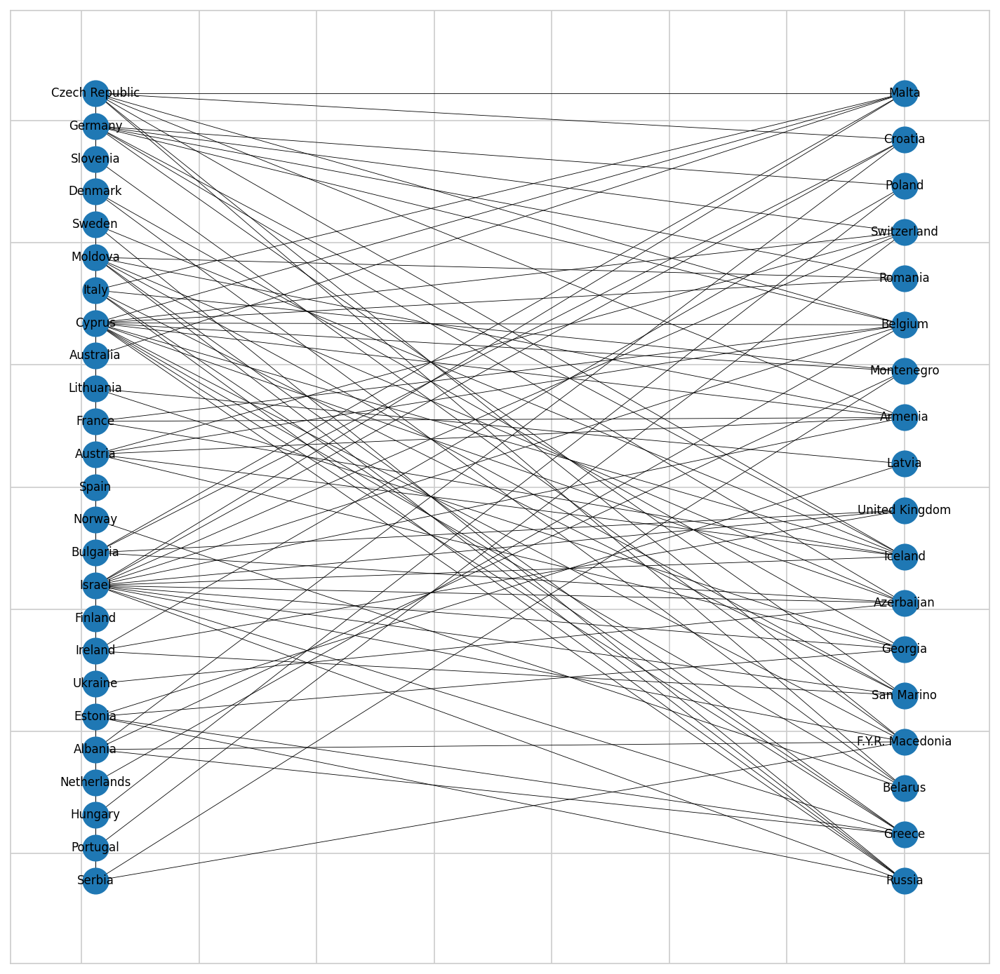

In [ ]:
B = nx.Graph()
for index, row in df.iterrows():
  B.add_edge(row['voting-country'], row['voted-for'], weight=1)
  B.add_nodes_from(voteFrom, bipartite = 0)
  B.add_nodes_from(voteTo, bipartite = 1)
plt.figure(figsize=(12,12), dpi=150)
pos = nx.spring_layout(B)
nx.draw_networkx(B, pos = nx.drawing.layout.bipartite_layout(B, voteTo), font_size = 8, width = 0.4)

bên trái là các nước được vote sau khi lọc (25 node), còn bên phải lúc này chỉ còn lại là 18 quốc gia vì có các nước trùng đó.

# Vẽ Đồ thị mạng🌏

In [ ]:
G = nx.Graph()
G = nx.from_pandas_edgelist(df,source='voting-country',target='voted-for',edge_attr='mean-points')

Text(0.5, 1.0, 'Đồ thị mạng theo hình tròn')

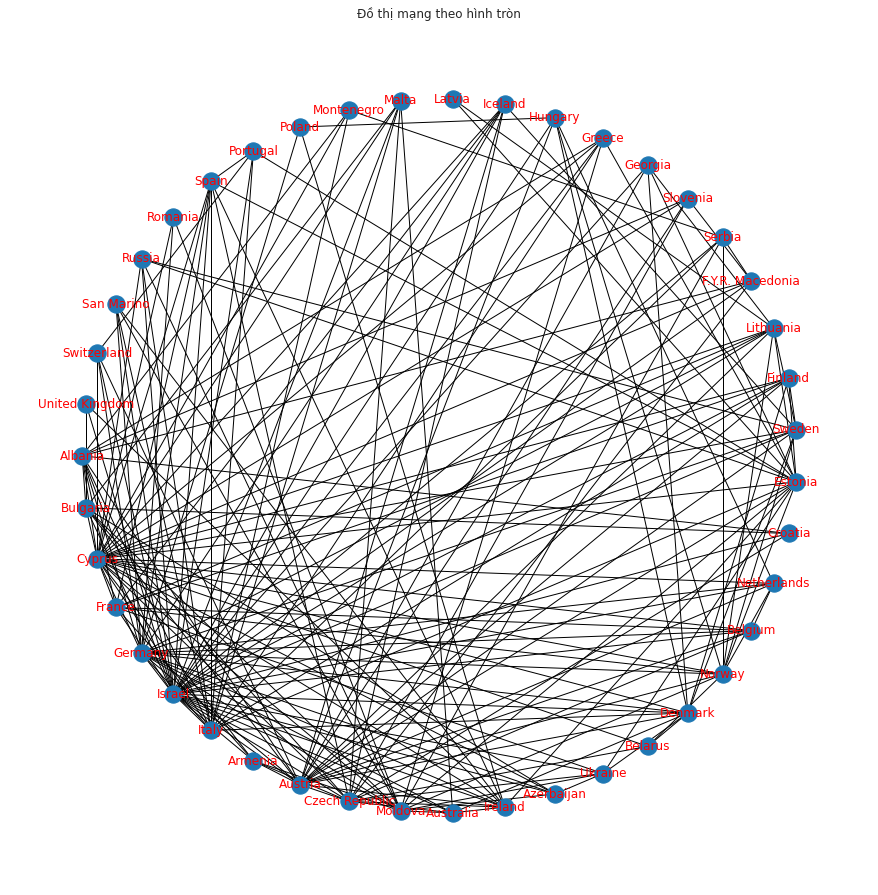

In [ ]:
#đồ thị 1 hướng thể hiện sự liên kết giữa các quốc gia
figure(figsize=(12, 12))
nx.draw_shell(G, with_labels=True,font_color='red')
plt.title("Đồ thị mạng theo hình tròn")

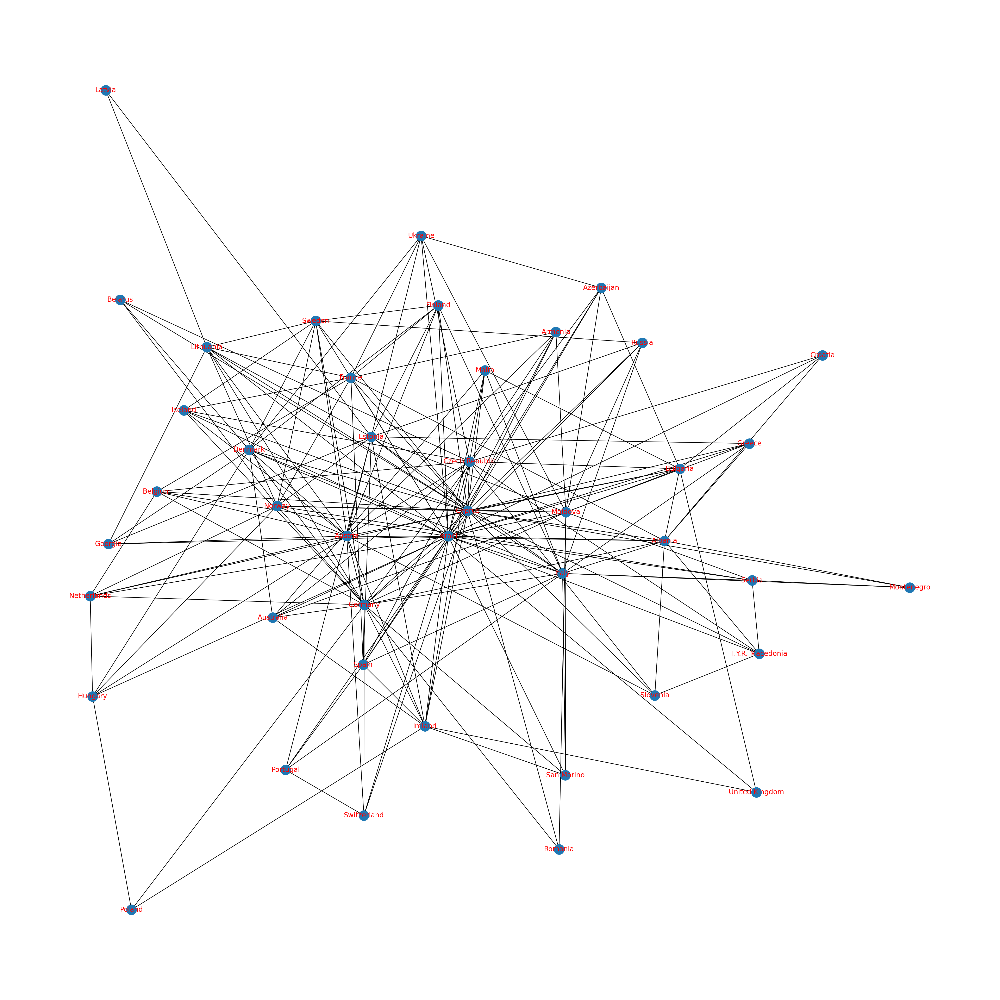

In [ ]:
plt.figure(figsize=(24,24),dpi=200)
nx.draw(G,with_labels=True,font_color='red')
plt.show()

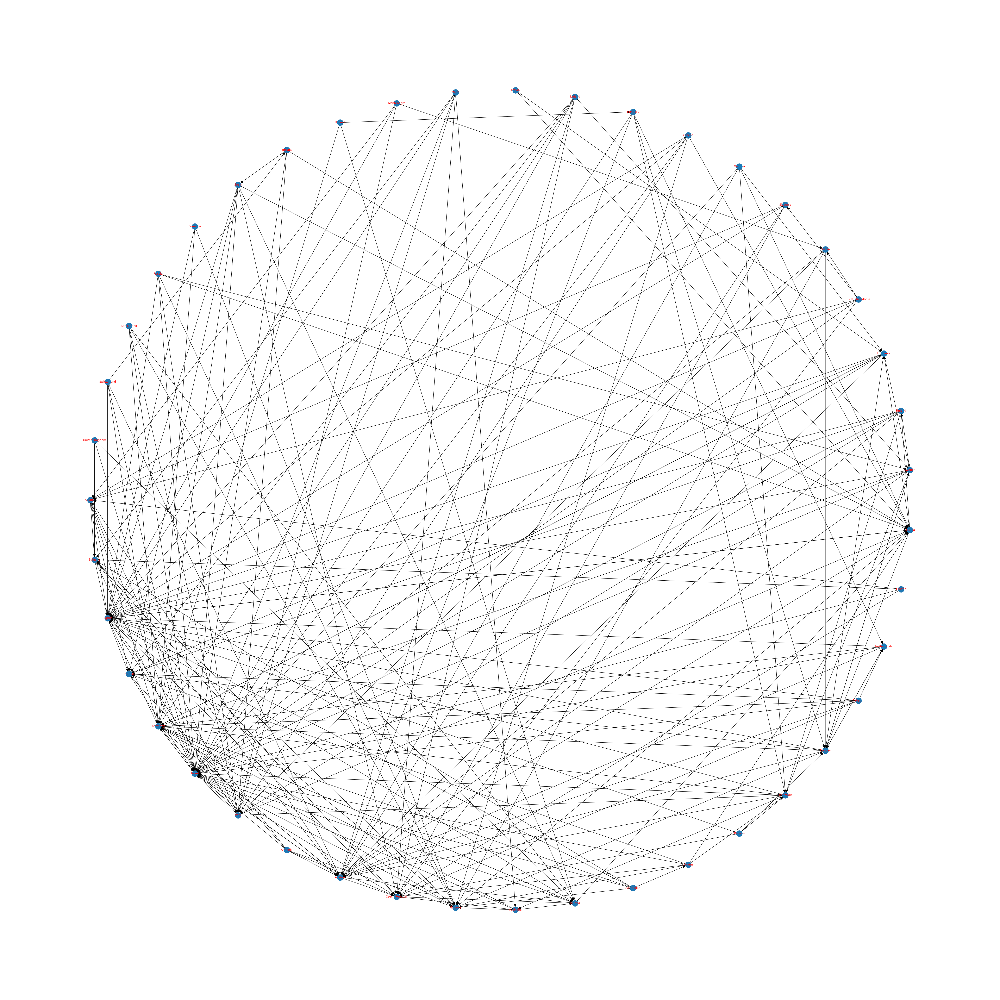

In [ ]:
#đồ thị có hướng
G2 = nx.from_pandas_edgelist(df,source='voting-country',target='voted-for',create_using=nx.DiGraph())
plt.figure(figsize=(24,24),dpi=200)
# pos = nx.spring_layout(G2)
nx.draw_shell(G2,font_size=5, with_labels=True, font_color='red',width=0.5,node_size=100)

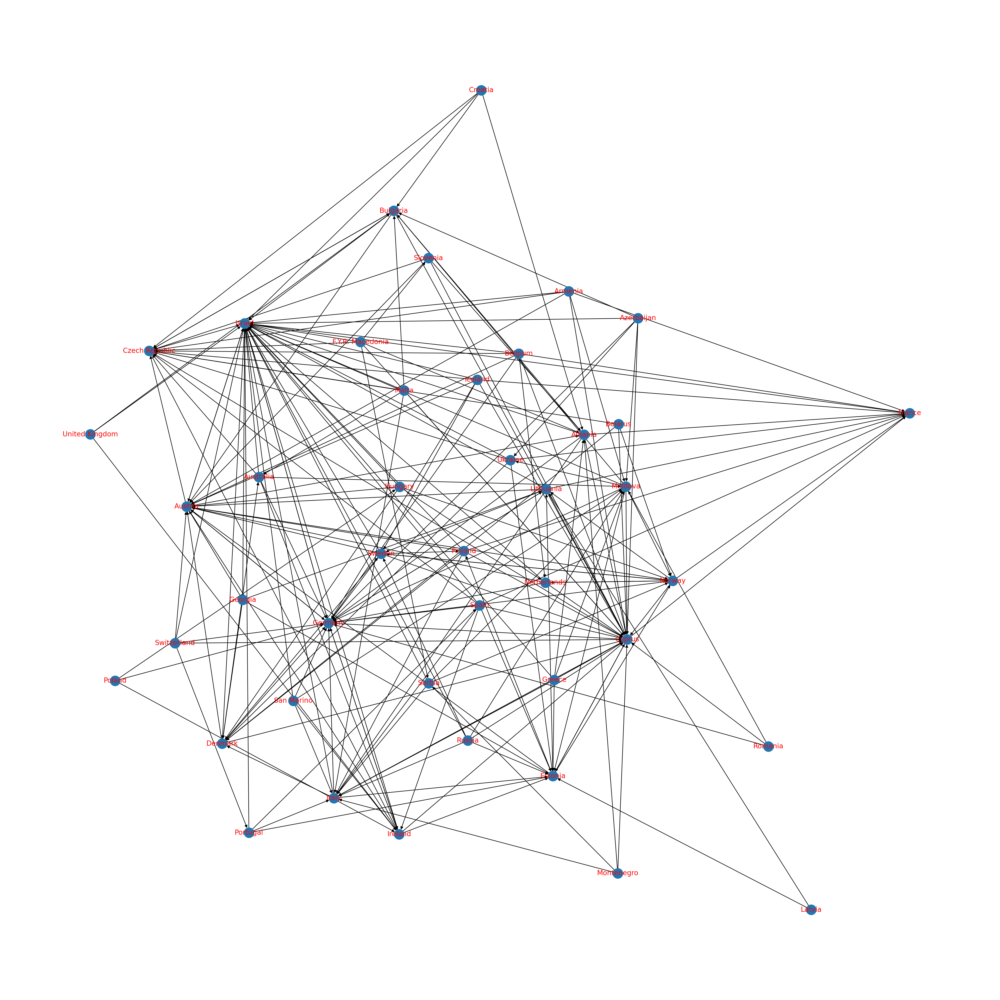

In [ ]:
plt.figure(figsize=(24,24),dpi=200)
nx.draw(G2,with_labels=True,font_color='red')
plt.show()

# Các độ đo vô hướng.💫

In [ ]:
# degree cho mỗi nút

for i in sorted(G.nodes()):
    G.nodes[i]['Degree'] = G.degree(i)
    
nodes_data = pd.DataFrame([i[1] for i in G.nodes(data=True)], index=[i[0] for i in G.nodes(data=True)])
nodes_data = nodes_data.sort_index(ascending= False)
nodes_data.index.names=['ID']
nodes_data.reset_index(level=0, inplace=True)

print(nodes_data)

                  ID  Degree
0     United Kingdom       3
1            Ukraine       7
2        Switzerland       5
3             Sweden      10
4              Spain       9
5           Slovenia       5
6             Serbia       6
7         San Marino       5
8             Russia       6
9            Romania       3
10          Portugal       5
11            Poland       3
12            Norway      12
13       Netherlands       7
14        Montenegro       4
15           Moldova      15
16             Malta       6
17         Lithuania      10
18            Latvia       2
19             Italy      15
20            Israel      33
21           Ireland      11
22           Iceland       7
23           Hungary       6
24            Greece       6
25           Germany      21
26           Georgia       5
27            France      11
28           Finland       8
29  F.Y.R. Macedonia       6
30           Estonia      15
31           Denmark      12
32    Czech Republic      16
33            

In [ ]:
#Betweenness centrality

bet_cen = nx.betweenness_centrality(G)
df_bet_cen = pd.DataFrame.from_dict(bet_cen, orient='index')
df_bet_cen.columns = ['betweenness_centrality']
df_bet_cen.index.names = ['ID']
df_bet_cen.reset_index(level=0, inplace=True)
Betweenness = pd.merge(nodes_data,df_bet_cen, on = ['ID'])

In [ ]:
# Clustering coefficient 

clust_coefficients = nx.clustering(G)
df_clust = pd.DataFrame.from_dict(clust_coefficients, orient='index')
df_clust.columns = ['clust_coefficient']
df_clust.index.names = ['ID']
df_clust.reset_index(level=0, inplace=True)
Clustering = pd.merge(Betweenness, df_clust, on = ['ID'])

In [ ]:
# Closeness centrality 

clo_cen = nx.closeness_centrality(G)
df_clo = pd.DataFrame.from_dict(clo_cen, orient='index')
df_clo.columns = ['closeness_centrality']
df_clo.index.names = ['ID']
df_clo.reset_index(level=0, inplace=True)
Closeness = pd.merge(Clustering, df_clo, on = ['ID'])

In [ ]:
#Harmonic Centrality

har = nx.harmonic_centrality(G)
df_har = pd.DataFrame.from_dict(har, orient='index')
df_har.columns = ['harmonic_centrality']
df_har.index.names = ['ID']
df_har.reset_index(level=0, inplace=True)
Harmonic = pd.merge(Closeness, df_har, on = ['ID'])

In [ ]:
# Eigenvector centrality

eig_cen = nx.eigenvector_centrality_numpy(G)
df_eig = pd.DataFrame.from_dict(eig_cen, orient='index')
df_eig.columns = ['eigenvector_centrality']
df_eig.index.names = ['ID']
df_eig.reset_index(level=0, inplace=True)
Eigenvector = pd.merge(Harmonic, df_eig, on = ['ID'])

In [ ]:
#Page rank

page_rank = nx.pagerank(G)
df_page_rank = pd.DataFrame.from_dict(page_rank, orient='index')
df_page_rank.columns = ['page_rank']
df_page_rank.index.names = ['ID']
df_page_rank.reset_index(level=0, inplace=True)
Page = pd.merge(Eigenvector,df_page_rank, on = ['ID'])


In [ ]:
Page.head(100)

,ID,Degree,betweenness_centrality,clust_coefficient,closeness_centrality,harmonic_centrality,eigenvector_centrality,page_rank
0,United Kingdom,3,0.000322,0.666667,0.482759,21.500000,0.053131,0.009723
1,Ukraine,7,0.003912,0.333333,0.531646,24.166667,0.108910,0.017938
2,Switzerland,5,0.001787,0.500000,0.525000,23.333333,0.102509,0.013725
3,Sweden,10,0.004849,0.577778,0.567568,26.000000,0.167512,0.024017
4,Spain,9,0.005802,0.527778,0.560000,25.500000,0.153274,0.022090
5,Slovenia,5,0.000525,0.700000,0.500000,22.666667,0.082843,0.013831
6,Serbia,6,0.004818,0.333333,0.525000,23.666667,0.084861,0.016413
7,San Marino,5,0.000532,0.700000,0.512195,23.000000,0.093631,0.013652
8,Russia,6,0.000960,0.600000,0.531646,23.833333,0.112746,0.015603
9,Romania,3,0.000000,1.000000,0.482759,21.500000,0.062559,0.009482


In [ ]:
#Sắp xếp giảm dần với giá trị Degree

Page.sort_values(by='Degree', ascending=False)

,ID,Degree,betweenness_centrality,clust_coefficient,closeness_centrality,harmonic_centrality,eigenvector_centrality,page_rank
20,Israel,33,0.238275,0.187500,0.823529,37.500000,0.357335,0.075831
33,Cyprus,29,0.166876,0.192118,0.763636,35.500000,0.324254,0.066739
25,Germany,21,0.077028,0.295238,0.666667,31.500000,0.271003,0.049057
39,Austria,20,0.056406,0.278947,0.656250,31.000000,0.253295,0.046260
32,Czech Republic,16,0.039626,0.283333,0.608696,28.833333,0.194288,0.038384
30,Estonia,15,0.049678,0.266667,0.600000,28.333333,0.181543,0.036581
19,Italy,15,0.032990,0.333333,0.608696,28.500000,0.193611,0.035983
15,Moldova,15,0.035406,0.295238,0.608696,28.500000,0.188793,0.036207
42,Albania,12,0.021180,0.363636,0.575342,26.833333,0.169636,0.029462
12,Norway,12,0.020167,0.363636,0.567568,26.666667,0.165389,0.029047


In [ ]:
#Edge_betweenness

E = nx.edge_betweenness_centrality(G)
df_E = pd.DataFrame.from_dict(E, orient='index')
df_E.columns = ['edge_betweenness']
df_E.index.names = ['ID']
df_E.reset_index(level=0, inplace=True)

#Sắp xếp theo edge_betweenness
df_E.sort_values(by='edge_betweenness', ascending=False)

,ID,edge_betweenness
104,"(Israel, United Kingdom)",0.030741
81,"(Israel, Croatia)",0.026330
69,"(Germany, Poland)",0.026323
39,"(Cyprus, Montenegro)",0.025201
184,"(Estonia, Latvia)",0.024848
...,...,...
179,"(Netherlands, Hungary)",0.003130
195,"(F.Y.R. Macedonia, Slovenia)",0.003047
188,"(Sweden, Iceland)",0.002925
191,"(Sweden, Finland)",0.002780


In [ ]:
hit = nx.hits(G)
df_hit = pd.DataFrame.from_dict(hit, orient='columns')
df_hit = pd.DataFrame(hit).transpose()
df_hit.columns = ['a', 'h']
df_hit.head(100)


,a,h
Albania,0.028991,0.028991
Bulgaria,0.024920,0.024920
Cyprus,0.055415,0.055415
France,0.026891,0.026891
Germany,0.046314,0.046314
Israel,0.061068,0.061068
Italy,0.033088,0.033088
Armenia,0.020117,0.020117
Austria,0.043288,0.043288
Czech Republic,0.033204,0.033204


# Các độ đo có hướng.🔃

In [ ]:
# degree cho mỗi nút

for i in sorted(G2.nodes()):
    G2.nodes[i]['DegreeCH'] = G2.degree(i)
    
nodes_dataCH = pd.DataFrame([i[1] for i in G2.nodes(data=True)], index=[i[0] for i in G2.nodes(data=True)])
nodes_dataCH = nodes_dataCH.sort_index(ascending= False)
nodes_dataCH.index.names=['ID']
nodes_dataCH.reset_index(level=0, inplace=True)

print(nodes_dataCH)

                  ID  DegreeCH
0     United Kingdom         3
1            Ukraine         7
2        Switzerland         5
3             Sweden        11
4              Spain         9
5           Slovenia         5
6             Serbia         6
7         San Marino         5
8             Russia         6
9            Romania         3
10          Portugal         5
11            Poland         3
12            Norway        14
13       Netherlands         8
14        Montenegro         4
15           Moldova        15
16             Malta         6
17         Lithuania        11
18            Latvia         2
19             Italy        16
20            Israel        35
21           Ireland        12
22           Iceland         7
23           Hungary         6
24            Greece         6
25           Germany        25
26           Georgia         5
27            France        11
28           Finland         8
29  F.Y.R. Macedonia         6
30           Estonia        16
31      

In [ ]:
#Betweenness centrality

bet_cenCH = nx.betweenness_centrality(G2)
df_bet_cenCH = pd.DataFrame.from_dict(bet_cenCH, orient='index')
df_bet_cenCH.columns = ['betweenness_centralityCH']
df_bet_cenCH.index.names = ['ID']
df_bet_cenCH.reset_index(level=0, inplace=True)
BetweennessCH = pd.merge(nodes_dataCH,df_bet_cenCH, on = ['ID'])

In [ ]:
# Clustering coefficient 

clust_coefficientsCH = nx.clustering(G2)
df_clustCH = pd.DataFrame.from_dict(clust_coefficientsCH, orient='index')
df_clustCH.columns = ['clust_coefficientCH']
df_clustCH.index.names = ['ID']
df_clustCH.reset_index(level=0, inplace=True)
ClusteringCH = pd.merge(BetweennessCH, df_clustCH, on = ['ID'])

In [ ]:
# Closeness centrality 

clo_cenCH = nx.closeness_centrality(G2)
df_cloCH = pd.DataFrame.from_dict(clo_cenCH, orient='index')
df_cloCH.columns = ['closeness_centralityCH']
df_cloCH.index.names = ['ID']
df_cloCH.reset_index(level=0, inplace=True)
ClosenessCH = pd.merge(ClusteringCH, df_clo, on = ['ID'])

In [ ]:
#Harmonic Centrality

harCH = nx.harmonic_centrality(G2)
df_harCH = pd.DataFrame.from_dict(harCH, orient='index')
df_harCH.columns = ['harmonic_centralityCH']
df_harCH.index.names = ['ID']
df_harCH.reset_index(level=0, inplace=True)
HarmonicHC = pd.merge(ClosenessCH, df_harCH, on = ['ID'])

In [ ]:
# Eigenvector centrality

eig_cenCH = nx.eigenvector_centrality_numpy(G2)
df_eigCH = pd.DataFrame.from_dict(eig_cenCH, orient='index')
df_eigCH.columns = ['eigenvector_centralityCH']
df_eigCH.index.names = ['ID']
df_eigCH.reset_index(level=0, inplace=True)
EigenvectorCH = pd.merge(HarmonicHC, df_eig, on = ['ID'])

In [ ]:
#Page rank

page_rankCH = nx.pagerank(G2)
df_page_rankCH = pd.DataFrame.from_dict(page_rankCH, orient='index')
df_page_rankCH.columns = ['page_rank']
df_page_rankCH.index.names = ['ID']
df_page_rankCH.reset_index(level=0, inplace=True)
PageCH = pd.merge(EigenvectorCH,df_page_rankCH, on = ['ID'])


In [ ]:
PageCH.head(100)

,ID,DegreeCH,betweenness_centralityCH,clust_coefficientCH,closeness_centrality,harmonic_centralityCH,eigenvector_centrality,page_rank
0,United Kingdom,3,0.000000,0.333333,0.482759,0.000000,0.053131,0.003488
1,Ukraine,7,0.003191,0.166667,0.531646,12.833333,0.108910,0.005233
2,Switzerland,5,0.000000,0.400000,0.525000,0.000000,0.102509,0.003488
3,Sweden,11,0.014237,0.314815,0.567568,19.416667,0.167512,0.021037
4,Spain,9,0.002710,0.319444,0.560000,1.500000,0.153274,0.004356
5,Slovenia,5,0.000290,0.350000,0.500000,1.000000,0.082843,0.003983
6,Serbia,6,0.005991,0.166667,0.525000,2.000000,0.084861,0.004724
7,San Marino,5,0.000000,0.450000,0.512195,0.000000,0.093631,0.003488
8,Russia,6,0.000000,0.366667,0.531646,0.000000,0.112746,0.003488
9,Romania,3,0.000000,0.500000,0.482759,0.000000,0.062559,0.003488


In [ ]:
#Sắp xếp giảm dần với giá trị Degree

PageCH.sort_values(by='DegreeCH', ascending=False)

,ID,DegreeCH,betweenness_centralityCH,clust_coefficientCH,closeness_centrality,harmonic_centralityCH,eigenvector_centrality,page_rank
20,Israel,35,0.073153,0.118887,0.823529,37.000000,0.357335,0.141994
33,Cyprus,31,0.058111,0.111231,0.763636,34.333333,0.324254,0.090798
25,Germany,25,0.033031,0.190878,0.666667,31.000000,0.271003,0.112709
39,Austria,22,0.044533,0.200873,0.656250,29.333333,0.253295,0.103633
32,Czech Republic,17,0.018852,0.148148,0.608696,27.166667,0.194288,0.054249
30,Estonia,16,0.055501,0.163866,0.600000,25.750000,0.181543,0.047952
19,Italy,16,0.021797,0.201681,0.608696,24.750000,0.193611,0.033465
15,Moldova,15,0.041657,0.157143,0.608696,17.933333,0.188793,0.010301
12,Norway,14,0.037286,0.196629,0.567568,22.166667,0.165389,0.019576
21,Ireland,12,0.016425,0.261538,0.575342,24.000000,0.162735,0.060922


In [ ]:
#Edge_betweenness

ECH = nx.edge_betweenness_centrality(G2)
df_ECH = pd.DataFrame.from_dict(ECH, orient='index')
df_ECH.columns = ['edge_betweennessCH']
df_ECH.index.names = ['ID']
df_ECH.reset_index(level=0, inplace=True)

#Sắp xếp theo edge_betweenness
df_ECH.sort_values(by='edge_betweennessCH', ascending=False)

,ID,edge_betweennessCH
21,"(Israel, Denmark)",0.057669
73,"(Denmark, Australia)",0.057207
53,"(Australia, Moldova)",0.039240
34,"(Austria, Albania)",0.025877
11,"(Cyprus, Estonia)",0.024874
...,...,...
180,"(Spain, Cyprus)",0.000738
141,"(Georgia, Israel)",0.000692
31,"(Armenia, France)",0.000554
88,"(Belgium, France)",0.000554


In [ ]:
hitCH = nx.hits(G2)
df_hitCH = pd.DataFrame.from_dict(hitCH, orient='columns')
df_hitCH = pd.DataFrame(hitCH).transpose()
df_hitCH.columns = ['a', 'h']
df_hitCH.head(456)


,a,h
Albania,0.032425,0.023139
Bulgaria,0.027127,0.030509
Cyprus,0.013521,0.139671
France,0.009396,0.057831
Germany,0.026029,0.102519
Israel,0.013093,0.155270
Italy,0.028655,0.050028
Armenia,0.032856,0.000000
Austria,0.023012,0.085758
Czech Republic,0.013164,0.067592


In [ ]:
#xuất file kết quả
rsCl = Page.sort_values(by='Degree', ascending=False)
rsCl.to_csv('rscl.csv')
rsClCH = PageCH.sort_values(by='DegreeCH', ascending=False)
rsClCH.to_csv('rsclCH.csv')

# Phân cụm bằng **Louvain**

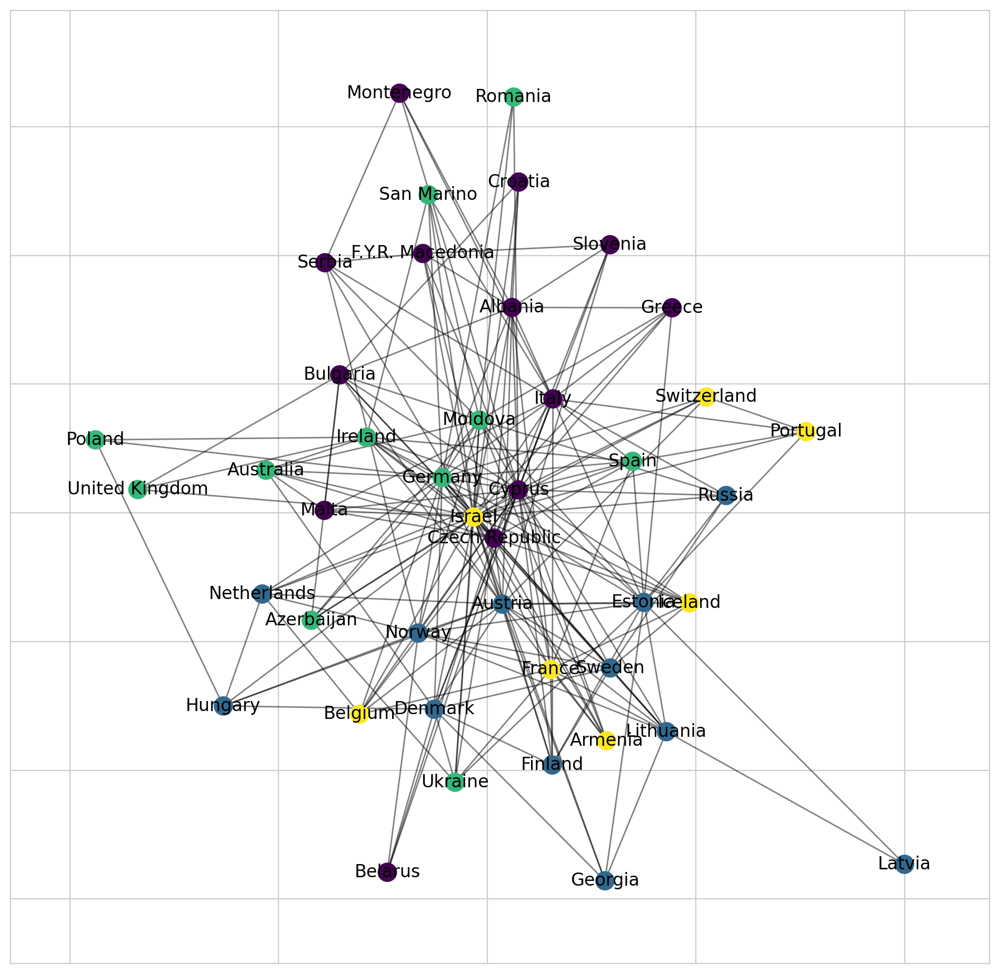

In [ ]:
plt.figure(figsize=(12,12),dpi=200)
partition = community_louvain.best_partition(G)

pos = nx.spring_layout(G)
cmap = cm.get_cmap('viridis',max(partition.values()) + 1)
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=150, cmap = cmap, node_color= list(partition.values()))

nx.draw_networkx_edges(G, pos, alpha=0.5)
nx.draw_networkx_labels(G, pos)

plt.show()

In [ ]:
#xuất ra số cụm 
values = list(partition.values())
print('số lượng cụm là : ', len(np.unique(values)))

số lượng cụm là :  4


In [ ]:
#Tách nhóm nước theo các cụm
grD0 = []
grD1 = []
grD2 = []
grD3 = []

for i in range(len(np.unique(values))):
  print('Cụm ', i)
  for name, k in partition.items():
    if k == i:
      print(name)
      if(i == 0):
        grD0.append(name)
      elif(i ==1):
        grD1.append(name)
      elif(i ==2):
        grD2.append(name)
      elif(i ==3):
        grD3.append(name)
  print("")

Cụm  0
Albania
Bulgaria
Cyprus
Italy
Czech Republic
Belarus
Croatia
F.Y.R. Macedonia
Serbia
Slovenia
Greece
Malta
Montenegro

Cụm  1
Austria
Denmark
Norway
Netherlands
Estonia
Sweden
Finland
Lithuania
Georgia
Hungary
Latvia
Russia

Cụm  2
Germany
Moldova
Australia
Ireland
Azerbaijan
Ukraine
Poland
Spain
Romania
San Marino
United Kingdom

Cụm  3
France
Israel
Armenia
Belgium
Iceland
Portugal
Switzerland



In [ ]:
df0 = df[df['voting-country'].isin(grD0)]
df1 = df[df['voting-country'].isin(grD1)]
df2 = df[df['voting-country'].isin(grD2)]
df3 = df[df['voting-country'].isin(grD3)]

## Khảo sát sự gom cụm của thuật toán Louvain

Text(0.5, 1.0, 'Thông kê các nước votting cụm 0')

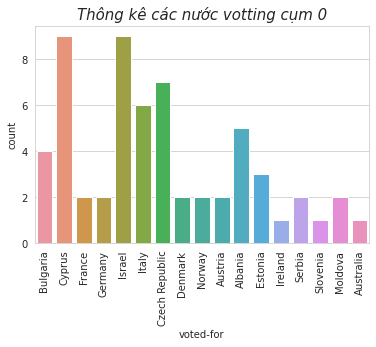

In [ ]:
# plt.subplot(1,3,2)
sns.countplot(x='voted-for',data=df0)
sns.set(rc={'figure.figsize':(20,8)})
plt.xticks(rotation=90)
# plt.ylabel('')
# plt.xlabel('')
plt.title('Thông kê các nước votting cụm 0',fontsize=15, style='oblique')

Text(0.5, 1.0, 'Thông kê các nước votting cụm 1')

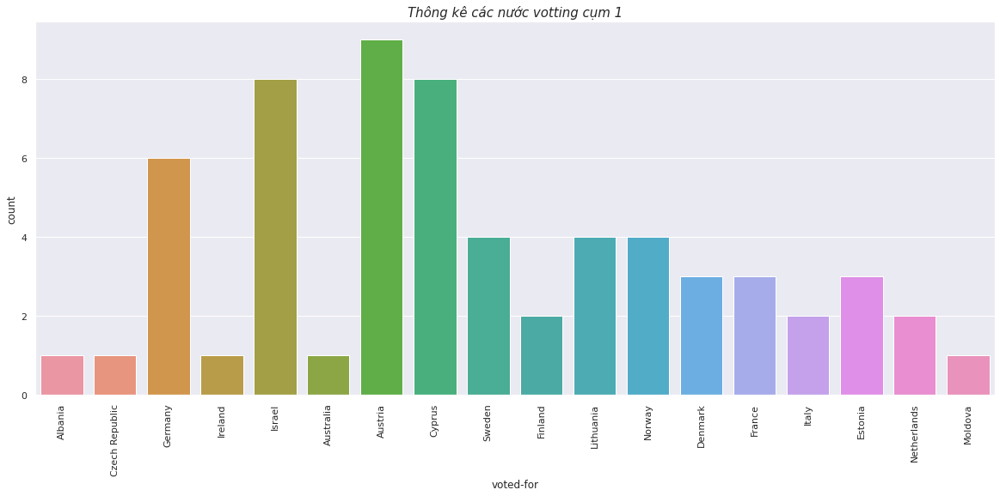

In [ ]:
# plt.subplot(1,3,2)
sns.countplot(x='voted-for',data=df1)
sns.set(rc={'figure.figsize':(20,8)})
plt.xticks(rotation=90)
# plt.ylabel('')
# plt.xlabel('')
plt.title('Thông kê các nước votting cụm 1',fontsize=15, style='oblique')

Text(0.5, 1.0, 'Thông kê các nước votting cụm 2')

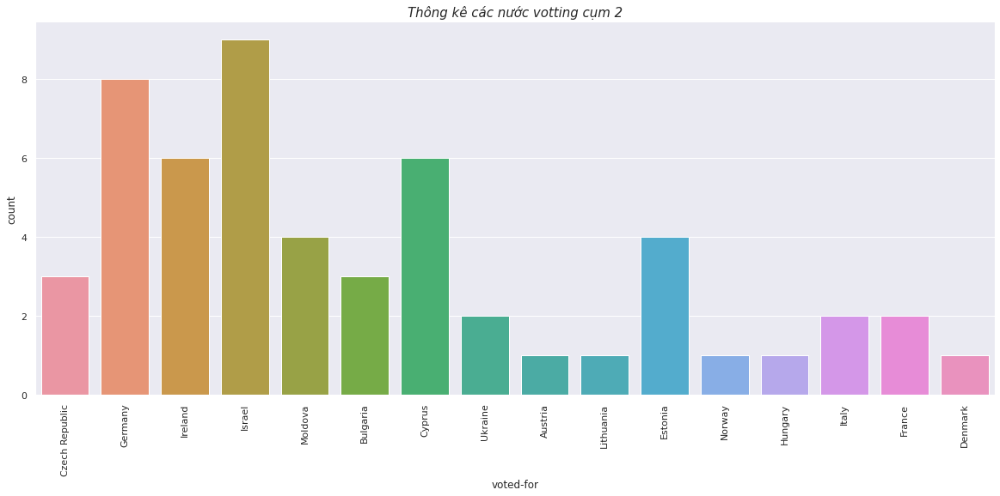

In [ ]:
# plt.subplot(1,3,2)
sns.countplot(x='voted-for',data=df2)
sns.set(rc={'figure.figsize':(20,8)})
plt.xticks(rotation=90)
# plt.ylabel('')
# plt.xlabel('')
plt.title('Thông kê các nước votting cụm 2',fontsize=15, style='oblique')

Text(0.5, 1.0, 'Thông kê các nước votting cụm 3')

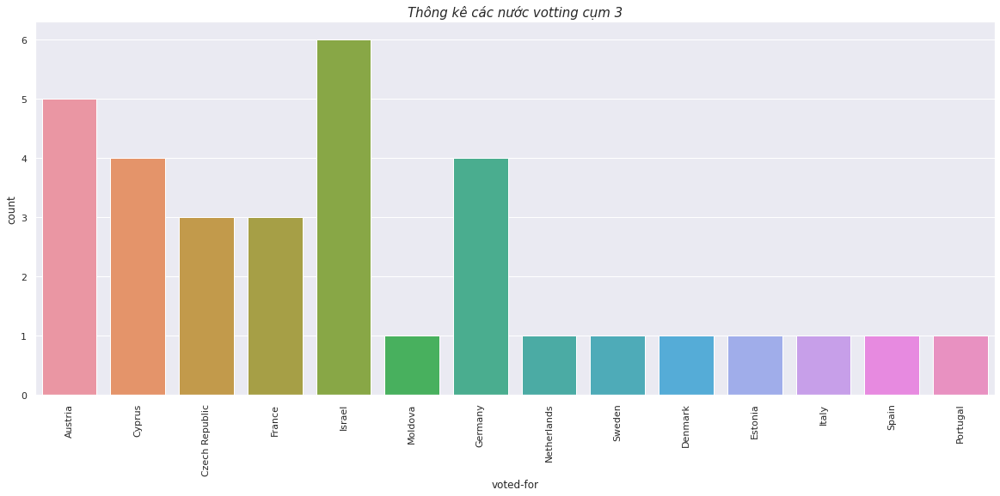

In [ ]:
# plt.subplot(1,3,2)
sns.countplot(x='voted-for',data=df3)
sns.set(rc={'figure.figsize':(20,8)})
plt.xticks(rotation=90)
# plt.ylabel('')
# plt.xlabel('')
plt.title('Thông kê các nước votting cụm 3',fontsize=15, style='oblique')

# Gom cụm bằng **`Girvan Newman`**

In [ ]:

__all__ = ["girvan_newman"]


def girvan_newman(G, most_valuable_edge=None):
    
    # If the graph is already empty, simply return its connected
    # components.
    if G.number_of_edges() == 0:
        yield tuple(nx.connected_components(G))
        return
    # If no function is provided for computing the most valuable edge,
    # use the edge betweenness centrality.
    if most_valuable_edge is None:

        def most_valuable_edge(G):
            """Returns the edge with the highest betweenness centrality
            in the graph `G`.

            """
            # We have guaranteed that the graph is non-empty, so this
            # dictionary will never be empty.
            betweenness = nx.edge_betweenness_centrality(G)
            return max(betweenness, key=betweenness.get)

    # The copy of G here must include the edge weight data.
    g = G.copy().to_undirected()
    # Self-loops must be removed because their removal has no effect on
    # the connected components of the graph.
    g.remove_edges_from(nx.selfloop_edges(g))
    while g.number_of_edges() > 0:
        yield _without_most_central_edges(g, most_valuable_edge)



def _without_most_central_edges(G, most_valuable_edge):
    
    original_num_components = nx.number_connected_components(G)
    num_new_components = original_num_components
    while num_new_components <= original_num_components:
        edge = most_valuable_edge(G)
        G.remove_edge(*edge)
        new_components = tuple(nx.connected_components(G))
        num_new_components = len(new_components)
    return new_components

Group: 1 
 ['Albania', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium', 'Bulgaria', 'Croatia', 'Cyprus', 'Czech Republic', 'Denmark', 'Estonia', 'F.Y.R. Macedonia', 'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Israel', 'Italy', 'Latvia', 'Lithuania', 'Malta', 'Moldova', 'Montenegro', 'Netherlands', 'Norway', 'Portugal', 'Romania', 'Russia', 'San Marino', 'Serbia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Ukraine', 'United Kingdom']
Group: 2 
 ['Poland']


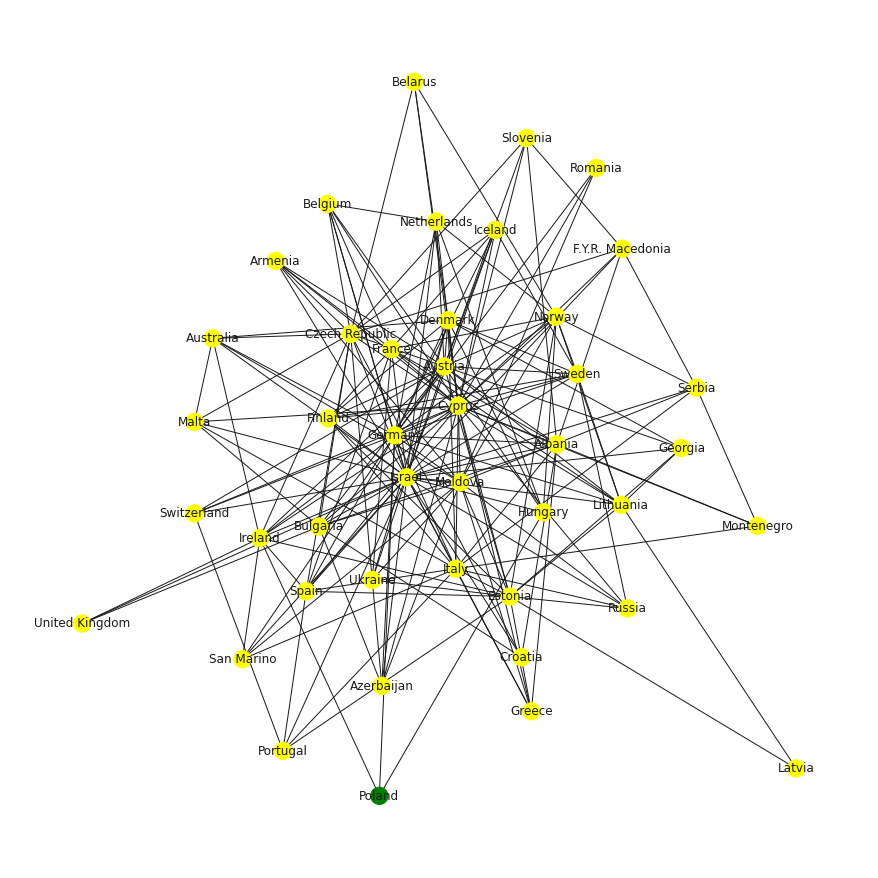

Group: 1 
 ['Albania', 'Armenia', 'Australia', 'Austria', 'Azerbaijan', 'Belarus', 'Belgium', 'Bulgaria', 'Croatia', 'Cyprus', 'Czech Republic', 'Denmark', 'Estonia', 'F.Y.R. Macedonia', 'Finland', 'France', 'Georgia', 'Germany', 'Greece', 'Hungary', 'Iceland', 'Ireland', 'Israel', 'Italy', 'Lithuania', 'Malta', 'Moldova', 'Montenegro', 'Netherlands', 'Norway', 'Portugal', 'Romania', 'Russia', 'San Marino', 'Serbia', 'Slovenia', 'Spain', 'Sweden', 'Switzerland', 'Ukraine', 'United Kingdom']
Group: 2 
 ['Latvia']
Group: 3 
 ['Poland']


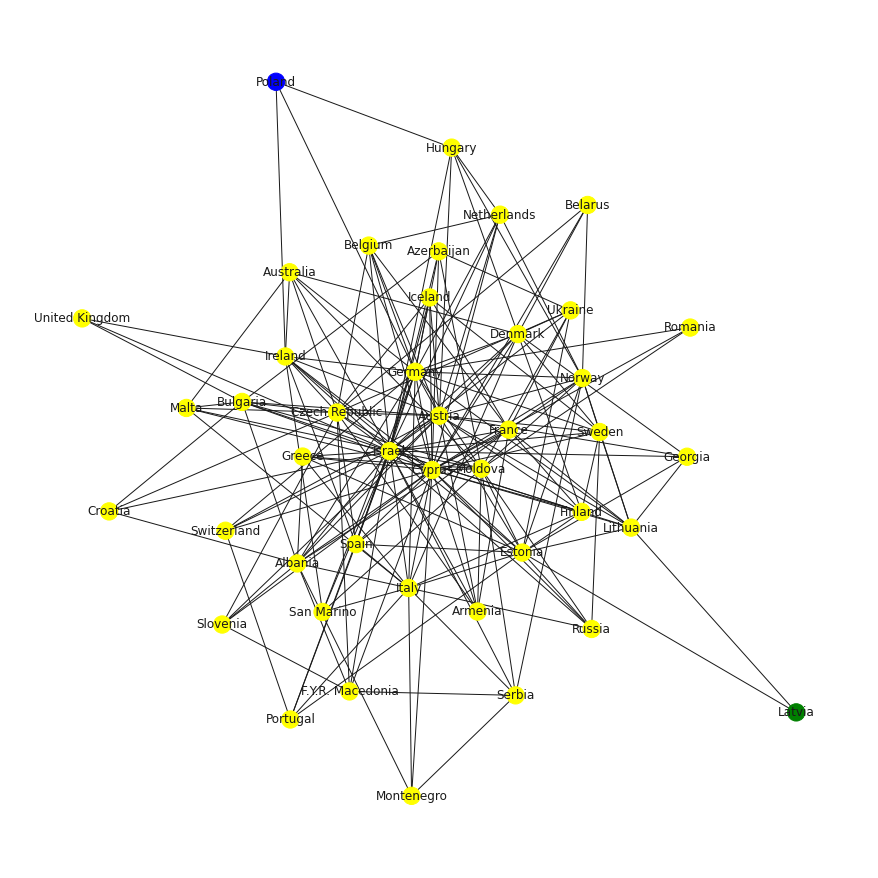

In [ ]:
k = 2

comp = girvan_newman(G)
for communities in itertools.islice(comp, k):
    node_groups = tuple(sorted(c) for c in communities)
    color_map = []
    for node in G:
        if node in node_groups[0]:
            color_map.append('yellow')
        elif node in node_groups[1]:
            color_map.append('green')
        elif node in node_groups[2]:
            color_map.append('blue')
        elif node in node_groups[3]:
            color_map.append('orange')
        elif node in node_groups[4]:
            color_map.append('pink')
        elif node in node_groups[5]:
            color_map.append('purple')
        else:
            color_map.append('coral')
        # Take user input
    number = 0 

    # Condition of the while loop
    while number < len(node_groups):  
        print("Group:", number+1,"\n", node_groups[number])
        # Increment the value of the variable "number by 1"
        number = number+1
    
    plt.figure(figsize=(12,12)) 
    nx.draw(G,node_color=color_map,with_labels=True)
    plt.show()

## Khảo sát sự gom cụm của thuật toán Girvan Newman

In [ ]:
newMan0 = df[df['voting-country'].isin(node_groups[0])]
newMan1 = df[df['voting-country'].isin(node_groups[1])]
newMan2 = df[df['voting-country'].isin(node_groups[2])]

Text(0.5, 1.0, 'Thông kê các nước votting cụm 1 (Girvan Newman)')

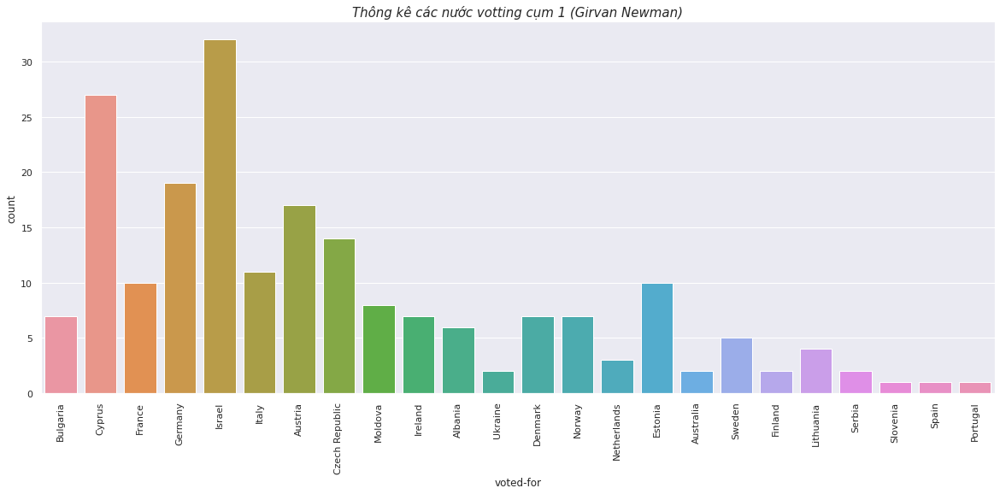

In [ ]:
# plt.subplot(1,3,2)
sns.countplot(x='voted-for',data=newMan0)
sns.set(rc={'figure.figsize':(20,8)})
plt.xticks(rotation=90)
# plt.ylabel('')
# plt.xlabel('')
plt.title('Thông kê các nước votting cụm 1 (Girvan Newman)',fontsize=15, style='oblique')

Text(0.5, 1.0, 'Thông kê các nước votting cụm 2 (Girvan Newman)')

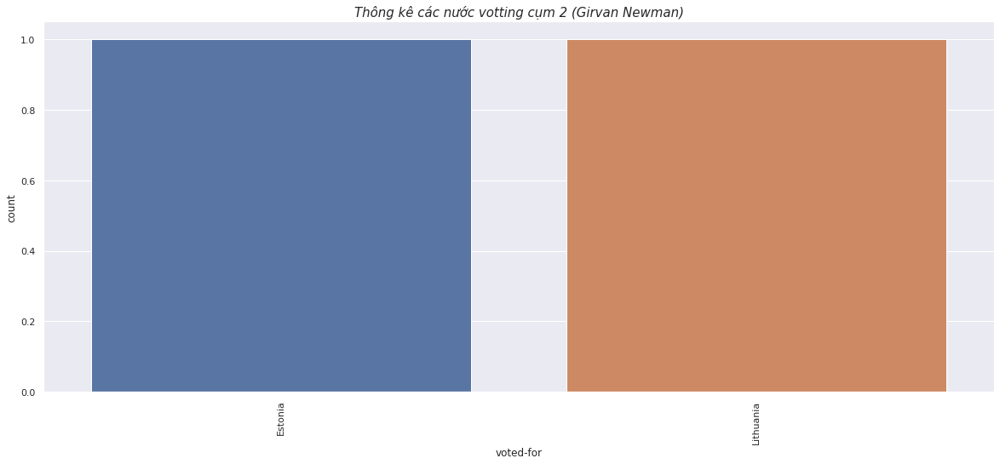

In [ ]:
sns.countplot(x='voted-for',data = newMan1)
sns.set(rc={'figure.figsize':(20,8)})
plt.xticks(rotation=90)
# plt.ylabel('')
# plt.xlabel('')
plt.title('Thông kê các nước votting cụm 2 (Girvan Newman)',fontsize=15, style='oblique')

Text(0.5, 1.0, 'Thông kê các nước votting cụm 3 (Girvan Newman)')

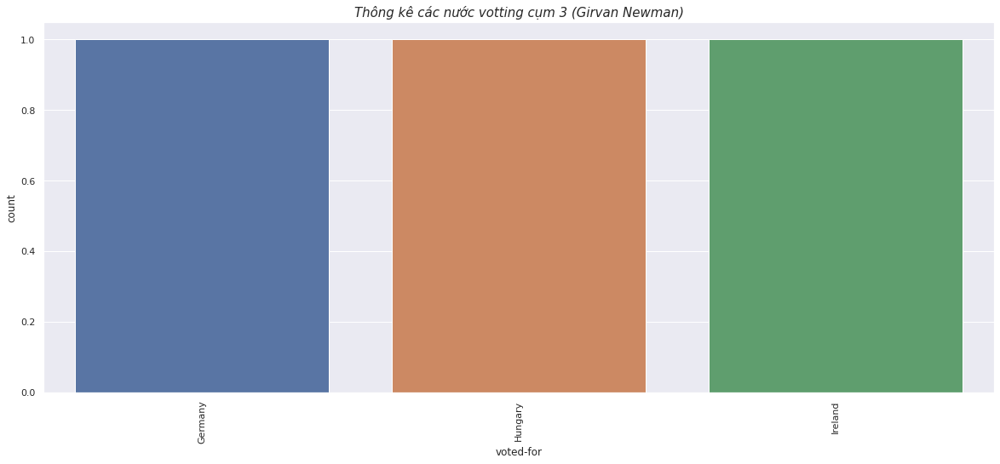

In [ ]:
sns.countplot(x='voted-for',data=newMan2)
sns.set(rc={'figure.figsize':(20,8)})
plt.xticks(rotation=90)
# plt.ylabel('')
# plt.xlabel('')
plt.title('Thông kê các nước votting cụm 3 (Girvan Newman)',fontsize=15, style='oblique')

# Gom cụm bằng **`KMeans`** [link](https://scikit-network.readthedocs.io/en/latest/tutorials/clustering/kmeans.html)

In [ ]:
!pip install scikit-network

In [ ]:
import sknetwork as skn
from IPython.display import SVG
import numpy as np
from sknetwork.clustering import KMeans, Louvain, modularity, bimodularity
from sknetwork.linalg import normalize
from sknetwork.embedding import GSVD
from sknetwork.utils import membership_matrix
from sknetwork.visualization import svg_graph, svg_digraph, svg_bigraph
from sknetwork.embedding.spring import Spring
from sknetwork.data import convert_edge_list, load_edge_list, load_graphml


In [ ]:
dfEdge = df[['voting-country', 'voted-for', 'mean-points']]
dfEdge

,voting-country,voted-for,mean-points
3,Albania,Bulgaria,7.0
4,Albania,Cyprus,10.0
9,Albania,France,6.0
10,Albania,Germany,7.0
13,Albania,Israel,3.0
...,...,...,...
1074,Ukraine,France,9.5
1078,Ukraine,Israel,11.0
1094,United Kingdom,Bulgaria,7.0
1103,United Kingdom,Ireland,6.5


In [ ]:
edge_list = list(dfEdge.itertuples(index=False))
graph = convert_edge_list(edge_list)
adjacency = graph.adjacency
spring = Spring()
position = spring.fit_transform(adjacency)
names = graph.names

In [ ]:
kmeans = KMeans(n_clusters=2, embedding_method=GSVD(3))
labels = kmeans.fit_transform(adjacency)

In [ ]:
unique_labels, counts = np.unique(labels, return_counts=True)
print(unique_labels, counts)

[0 1] [29 14]


In [ ]:
labels

array([1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0])

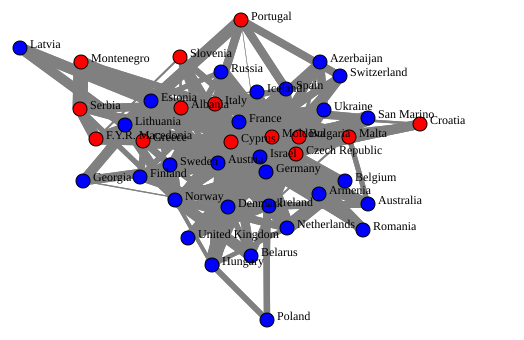

In [ ]:
image = svg_graph(adjacency, position, names = names, labels=labels, height=300)
SVG(image)

In [ ]:
x = np.array(voteFrom)
lsTeam = np.unique(x)

In [ ]:
dfListTeam = pd.DataFrame(lsTeam)
dfListClus = pd.DataFrame(labels)
dfKmean = pd.concat([dfListTeam,dfListClus], axis = 1)
dfKmean.columns = ['country','clus']
dfKmean

,country,clus
0,Albania,1
1,Armenia,0
2,Australia,0
3,Austria,0
4,Azerbaijan,0
5,Belarus,0
6,Belgium,0
7,Bulgaria,1
8,Croatia,1
9,Cyprus,1


In [ ]:
clus0 = dfKmean[dfKmean['clus']==0]
clus1 = dfKmean[dfKmean['clus']==1]
grClus0 = clus0['country']
grClus1 = clus1['country']
gr0 = df[df['voting-country'].isin(grClus0)]
gr1 = df[df['voting-country'].isin(grClus1)]
print(len(grClus0))
print(len(grClus1))

29
14


In [ ]:
np.array(grClus1)

array(['Albania', 'Bulgaria', 'Croatia', 'Cyprus', 'Czech Republic',
       'F.Y.R. Macedonia', 'Greece', 'Italy', 'Malta', 'Moldova',
       'Montenegro', 'Portugal', 'Serbia', 'Slovenia'], dtype=object)

Text(0.5, 1.0, 'Thông kê các nước votting cụm 1 (Kmean)')

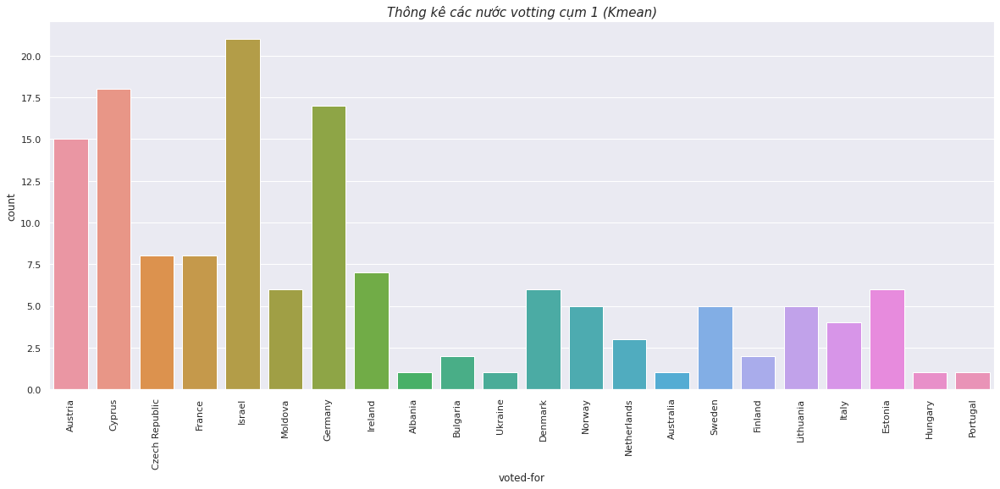

In [ ]:
sns.countplot(x='voted-for',data=gr0)
sns.set(rc={'figure.figsize':(20,8)})
plt.xticks(rotation=90)
# plt.ylabel('')
# plt.xlabel('')
plt.title('Thông kê các nước votting cụm 1 (Kmean)',fontsize=15, style='oblique')

Text(0.5, 1.0, 'Thông kê các nước votting cụm 2 (Kmean)')

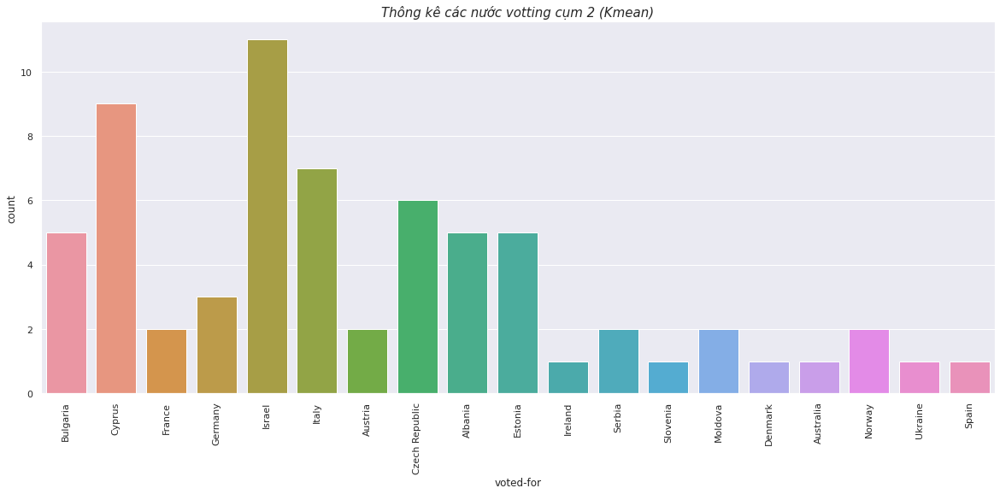

In [ ]:
sns.countplot(x='voted-for',data=gr1)
sns.set(rc={'figure.figsize':(20,8)})
plt.xticks(rotation=90)
plt.title('Thông kê các nước votting cụm 2 (Kmean)',fontsize=15, style='oblique')